In [62]:
import numpy as np
import matplotlib.pyplot as plt
import cPickle as pkl
import pandas as pd
import os,sys,glob,h5py
from scipy.optimize import curve_fit
from scipy.stats import spearmanr,pearsonr,kendalltau,zscore
from braintv_ephys_dev.workstation.danield.generalephys import placeAxesOnGrid, cleanAxes
from braintv_ephys_dev.workstation.danield import utils
from braintv_ephys_dev.workstation.danield import rf_analysis as rf
from braintv_ephys_dev.workstation.danield import psth_and_raster as psth
from braintv_ephys_dev.workstation.danield import reliability_and_precision as rp

import seaborn as sns
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
folder ='/Users/danieljdenman/Desktop/data/nwbs/temporal'

In [6]:
eye_paths = glob.glob(folder+'/*racking*.nwb')

In [12]:
dfs = [utils.df_from_nwb(path) for path in eye_paths]
df = pd.concat(dfs,ignore_index=True)

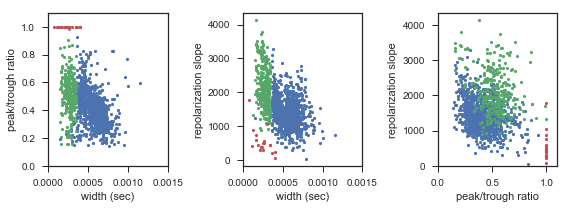

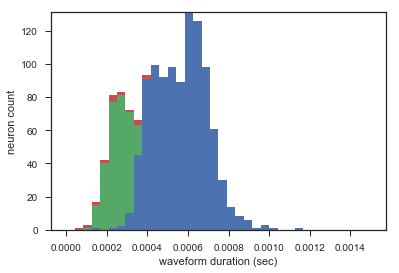

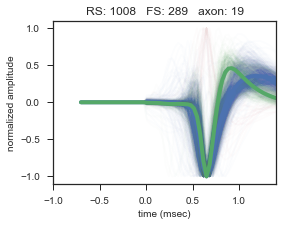

In [24]:
df=utils.classify_waveform_shape(df,plots=True,use_kmeans=True)

In [33]:
structure = []
for index in df.index:
    if df.probe[index] == 'V1' or df.probe[index] == 'LGN':
        structure.extend([df.probe[index]])
    else:
        if df.depth[index] < 1000.:
            structure.extend(['V1'])
        else:
            if df.depth[index] > 1900.:
                structure.extend(['LGN'])
            else:
                structure.extend(['other'])
df['structure']=structure
df_lgn = df[df.structure=='LGN']
df_v1 = df[df.structure=='V1']
dfv = pd.concat([df_v1,df_lgn])

In [28]:
nwbs={}
for nwb_path in df.nwb_path.unique():
    try:
        nwbs[nwb_path]=h5py.File(nwb_path)
    except:
        print('failed: '+nwb_path)

In [43]:
for nwb_path in df.nwb_path.unique():
    dft = df[df.nwb_path==nwb_path]
    dft = dft[dft.structure=='V1']
#     print nwb_path+'  '+str(dft.shape[0])

/Users/danieljdenman/Desktop/data/nwbs/temporal/M319892_dual_25082017_withEyetracking1.nwb  104
/Users/danieljdenman/Desktop/data/nwbs/temporal/M319891_dual_31082017_withEyetracking.nwb  71
/Users/danieljdenman/Desktop/data/nwbs/temporal/M310008_07-35-06_v1_angled_d_withEyetracking.nwb  76
/Users/danieljdenman/Desktop/data/nwbs/temporal/M319891_dual_01092017_withEyetracking.nwb  36
/Users/danieljdenman/Desktop/data/nwbs/temporal/M319892_dual_24082017_withEyetracking.nwb  104
/Users/danieljdenman/Desktop/data/nwbs/temporal/M310008_08-52-48_v1_angled3_d2_withEyetracking.nwb  81
/Users/danieljdenman/Desktop/data/nwbs/temporal/M319892_dual_23082017_withEyetracking.nwb  75
/Users/danieljdenman/Desktop/data/nwbs/temporal/M260686_insertion1_V1_withEyetracking3.nwb  90
/Users/danieljdenman/Desktop/data/nwbs/temporal/M310008_07-27-13_v1_angled_d_withEyetracking.nwb  93
/Users/danieljdenman/Desktop/data/nwbs/temporal/M227398_insertion1_withEyetracking.nwb  59
/Users/danieljdenman/Desktop/data/nw

In [54]:
nwb_data = nwbs[nwb_path]

In [104]:
dft_sorted = dft.sort('depth')

/usr/local/lib/python2.7/site-packages/ipykernel/__main__.py:1: FutureWarning: sort(columns=....) is deprecated, use sort_values(by=.....)
  if __name__ == '__main__':


In [106]:
dft=dft_sorted

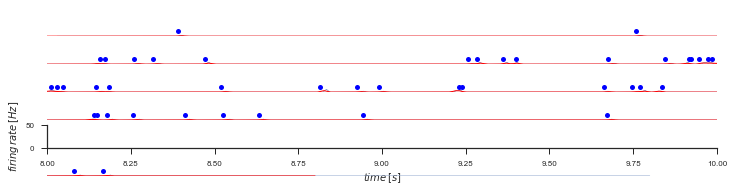

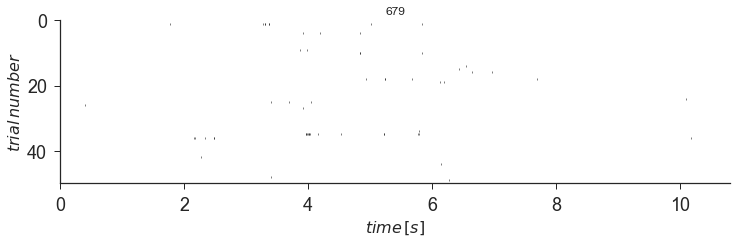

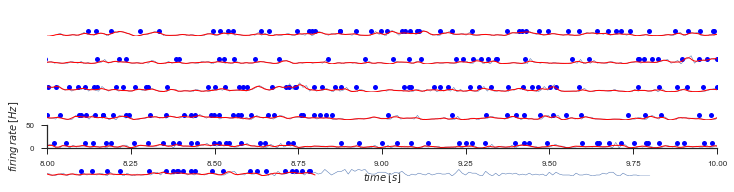

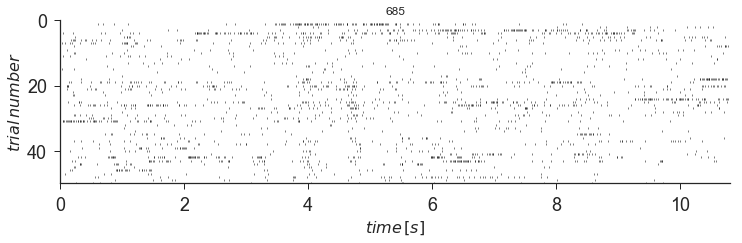

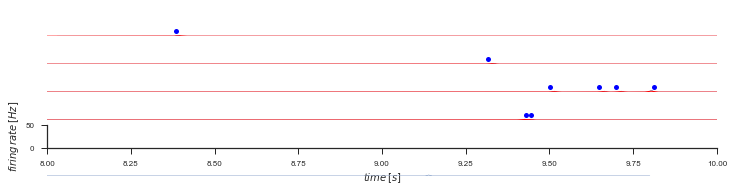

...

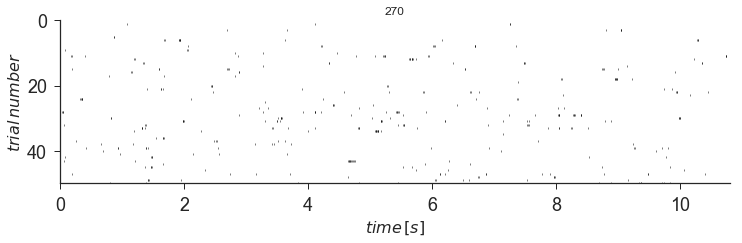

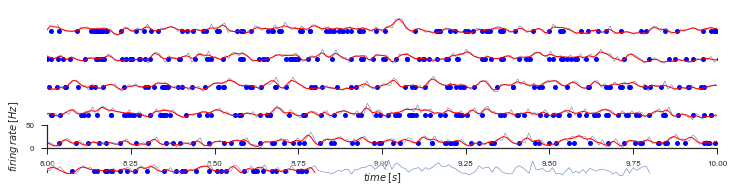

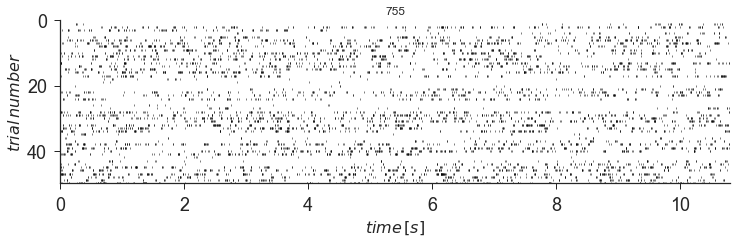

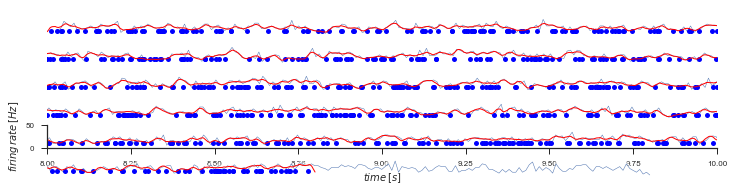

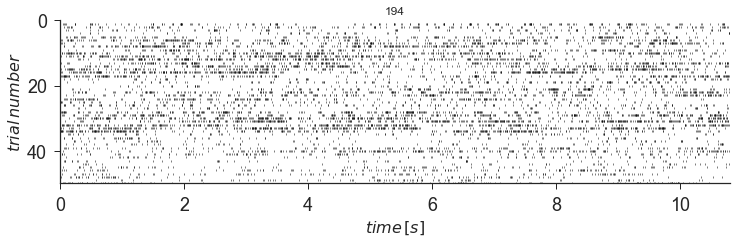

In [107]:
post=10.8
for ii,times in enumerate(dft.times):
    spike_times = times
    stimulus_times =  np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'][::118])
    smoothed,minima,minima2 = rp.get_events(spike_times,stimulus_times,post=post,threshold=0.2,boxcar_size=10,binsize=.002)

    f,axes = plt.subplots(6,1,figsize=(12,3))
    #ax.plot(ev,np.ones(len(ev))*10.,'bo')
    for i,ax in enumerate(axes):
        if i !=4:
            psth.psth_line(spike_times,stimulus_times,pre=0.,post=post,binsize=0.01,output='fig',timeDomain=True,axes=ax,ymax=50,labels=False,error='shaded',color=sns.color_palette()[0])
            cleanAxes(ax,total=True)
        else:
            psth.psth_line(spike_times,stimulus_times,pre=0.,post=post,binsize=0.01,output='fig',timeDomain=True,axes=ax,ymax=50,labelsize=8,axis_labelsize=10,error='shaded',color=sns.color_palette()[0])
        #ax.plot(minima,np.ones(len(minima))*18.,'ro')
        ax.plot(minima2,np.ones(len(minima2))*post,'bo',ms=5)
        ax.plot(np.linspace(0,post,len(smoothed)),smoothed,'r-',lw=1)
        #ax.plot(np.linspace(0,15,len(moving)),moving,'b-')
        ax.set_xlim(i*2.,i*2.+2)
    

    panelname = 'flicker_first_spike_V1_PSTH'
    #plt.gcf().savefig(os.path.join(basepath,'figures','panels',panelname+'.png'),fmt='png',dpi=300)
    #plt.gcf().savefig(os.path.join(basepath,'figures','panels',panelname+'.eps'),fmt='eps')

    f,ax=plt.subplots(1,1,figsize=(12,3))
    dump=psth.raster(spike_times,stimulus_times,pre=0.0,post=post,timeDomain=True,axes=ax,markersize=4.2,color='k')
    # ax.set_xlim(5.5,5.8)
    panelname = 'flicker_first_spike_V1_raster'
    ax.set_title(dft.cell[dft.index[ii]])
    #plt.gcf().savefig(os.path.join(basepath,'figures','panels',panelname+'.png'),fmt='png',dpi=300)
    #plt.gcf().savefig(os.path.join(basepath,'figures','panels',panelname+'.eps'),fmt='eps')

In [109]:
dft[dft.cell=='408'].index[0]

1136

In [117]:
dft[dft.depth<357.].shape

(53, 18)

In [115]:
df_range=dft[dft.depth<357.]
for i in range(df_range.shape[0]):
    
    

(53, 18)

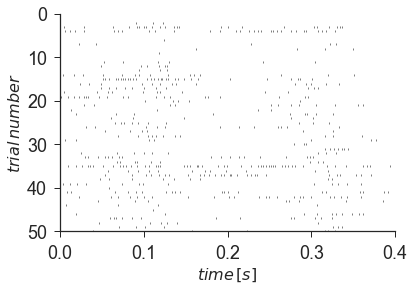

In [92]:
stimulus_times =  np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'][88::118])
dump=psth.raster(spike_times,stimulus_times,pre=0.0,post=0.4,timeDomain=True,markersize=4.2,color='k')

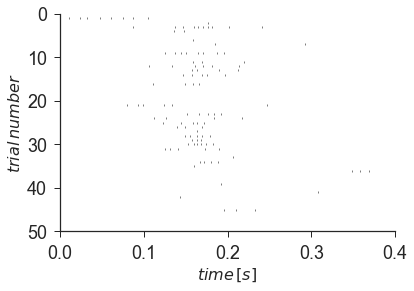

In [75]:
stimulus_times =  np.array(nwb_data['stimulus']['presentation']['natural_scenes']['timestamps'][55::118])
dump=psth.raster(spike_times,stimulus_times,pre=0.0,post=0.4,timeDomain=True,markersize=4.2,color='k')